<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Explain instruct  PIX2PIX diffusion base</b></div>

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Required Library</b></div>

In [1]:
!git clone https://github.com/huggingface/transformers.git

Cloning into 'transformers'...
remote: Enumerating objects: 240596, done.
remote: Counting objects: 100% (368/368), done.
remote: Compressing objects: 100% (174/174), done.
remote: Total 240596 (delta 196), reused 274 (delta 155), pack-reused 240228 (from 1)
Receiving objects: 100% (240596/240596), 253.11 MiB | 28.74 MiB/s, done.
Resolving deltas: 100% (176046/176046), done.


In [2]:
!pip install diffusers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 36.9 MB/s eta 0:00:00


In [3]:
!pip install sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.7/268.7 kB 5.8 MB/s eta 0:00:00


In [4]:
!pip install torch

In [5]:
!pip install pot

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.6/865.6 kB 21.0 MB/s eta 0:00:00


In [6]:
from diffusers import DiffusionPipeline, StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
import torch
from PIL import Image
import requests
from io import BytesIO

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from sentence_transformers import SentenceTransformer
import time
import os

from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
from PIL import Image
from IPython.display import display, Image as Image2
import sys
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
import requests
import cv2
from sklearn.decomposition import TruncatedSVD

from sklearn.linear_model import LinearRegression
from scipy.spatial.distance import cosine
import matplotlib.pyplot as plt
from matplotlib import transforms
import torch
import os
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import Ridge
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from itertools import chain, combinations
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import wasserstein_distance
from gensim.models import KeyedVectors
from gensim.downloader import load as api_load
from gensim.models import KeyedVectors
from sklearn.metrics.pairwise import euclidean_distances
from scipy.spatial.distance import cdist
from transformers import AutoTokenizer, AutoModel
import torch
import tensorflow as tf
from gensim.models import KeyedVectors
from torch import Generator
import warnings
warnings.filterwarnings('ignore')


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Required Models</b></div>

In [7]:
#Instruct PIX2PIX
# Initialize the model and pipeline
model_name = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_name, torch_dtype=torch.float16)
device = "cuda"
pipe.to(device)


model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.91k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/569 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.02k [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionInstructPix2PixPipeline {
  "_class_name": "StableDiffusionInstructPix2PixPipeline",
  "_diffusers_version": "0.31.0",
  "_name_or_path": "timbrooks/instruct-pix2pix",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [8]:
#DinoV2
processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
model = AutoModel.from_pretrained("facebook/dinov2-base")

preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

In [9]:
#Word2Vec model
model_path_bin = '/kaggle/input/google_word_/tensorflow2/default/1/GoogleNews-vectors-negative300.bin'
model_txt = KeyedVectors.load_word2vec_format(model_path_bin, binary=True)


<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Inputs</b></div>

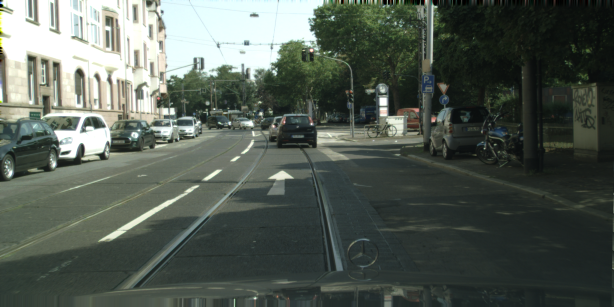

In [10]:
# Load the initial image
url = "/kaggle/input/resize30/1(1).png"
init_image = Image.open(url)
display(init_image)

In [11]:
cfg_image = 7.5 # This controls how much the output should resemble the original image
cfg_text = 1.5 # This controls how much the output should follow the text prompt

In [12]:
prompt = "convert this image to winter"
words = prompt.split()
words

['convert', 'this', 'image', 'to', 'winter']

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Generate Original Image with original prompt</b></div>

  0%|          | 0/100 [00:00<?, ?it/s]

Wasserstein distance: 0.028636010977758523


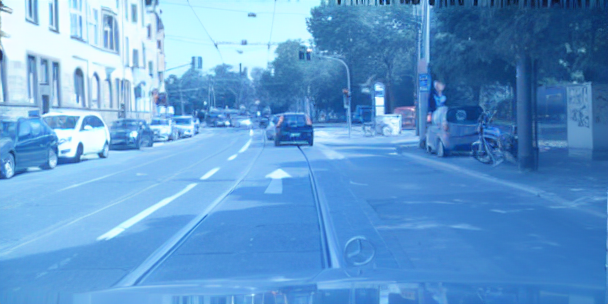

Image generation complete with acceptable Wasserstein distance!


In [13]:
def extract_image_embedding(image, processor, model):
    """Extract embeddings from an image using the DINOv2 model."""
    inputs = processor(images=image, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze().cpu().numpy()
    return embeddings

# Set initial Wasserstein distance to a large number
WD_dist_init = float('inf')

# Repeat generation process until Wasserstein distance is less than 0.1
while WD_dist_init > 0.07:
    # Generate the image
    orig_image = pipe(
        prompt=prompt, 
        image=init_image, 
        cfg_image=cfg_image, 
        cfg_text=cfg_text, 
    ).images[0]
    
    
    # Extract embeddings for the original image and initial image
    orig_embedding = extract_image_embedding(orig_image, processor, model)
    init_embedding = extract_image_embedding(init_image, processor, model)
    
    # Calculate Wasserstein distance between the embeddings
    WD_dist_init = wasserstein_distance(orig_embedding, init_embedding)

    print(f'Wasserstein distance: {WD_dist_init}')

    # Save and display the image only if the distance is acceptable
    if WD_dist_init <= 0.07:
        output_path = '/kaggle/working/orig_image.png'  # Set the output path
        orig_image.save(output_path)
        display(orig_image)

print("Image generation complete with acceptable Wasserstein distance!")


<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>LIME Explainability</b></div>

Perturbation: (0, 0, 0, 1, 1), Perturbed Text: to winter
Perturbation: (0, 1, 1, 1, 0), Perturbed Text: to image this
Perturbation: (1, 0, 1, 0, 1), Perturbed Text: convert image winter
Perturbation: (1, 0, 1, 1, 0), Perturbed Text: to convert image
Perturbation: (1, 1, 1, 0, 0), Perturbed Text: convert image this
Perturbation: (1, 0, 0, 0, 0), Perturbed Text: convert winter this
Perturbation: (1, 1, 1, 1, 1), Perturbed Text: convert to image this winter
Perturbation: (0, 0, 1, 0, 0), Perturbed Text: to image this
Perturbation: (1, 0, 1, 0, 0), Perturbed Text: convert image
Perturbation: (0, 1, 1, 1, 1), Perturbed Text: to image winter this
Perturbation: (0, 0, 1, 1, 0), Perturbed Text: to image
Perturbation: (1, 0, 0, 0, 1), Perturbed Text: convert winter
Perturbation: (0, 0, 1, 1, 1), Perturbed Text: to image winter
Perturbation: (0, 0, 0, 0, 1), Perturbed Text: image winter
Perturbation: (0, 1, 0, 0, 1), Perturbed Text: winter this
Perturbation: (1, 1, 0, 0, 1), Perturbed Text: conv

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 1:
Wasserstein distance (generated vs init): 0.023925788275088657
Wasserstein distance (generated vs orig): 0.01204729440041773


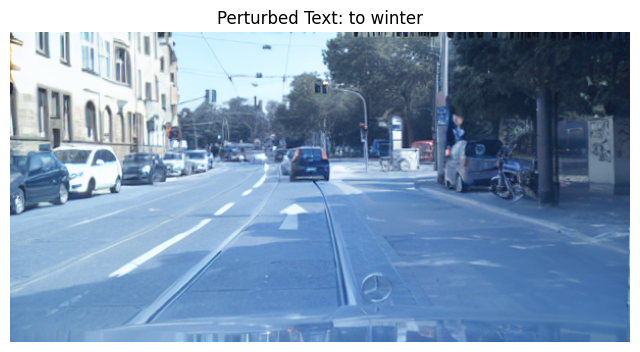

Image generation 1 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 2:
Wasserstein distance (generated vs init): 0.02605816360816486
Wasserstein distance (generated vs orig): 0.006341268915396845


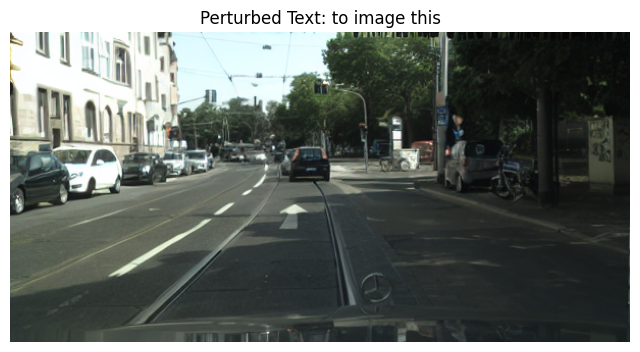

Image generation 2 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 3:
Wasserstein distance (generated vs init): 0.025286173120093746
Wasserstein distance (generated vs orig): 0.014502201031367205


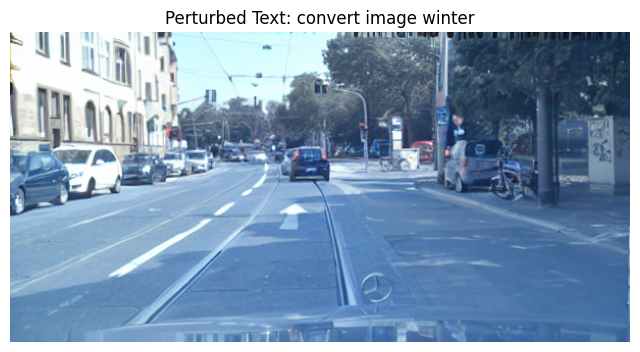

Image generation 3 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 4:
Wasserstein distance (generated vs init): 0.027639320376238192
Wasserstein distance (generated vs orig): 0.007139045924456401


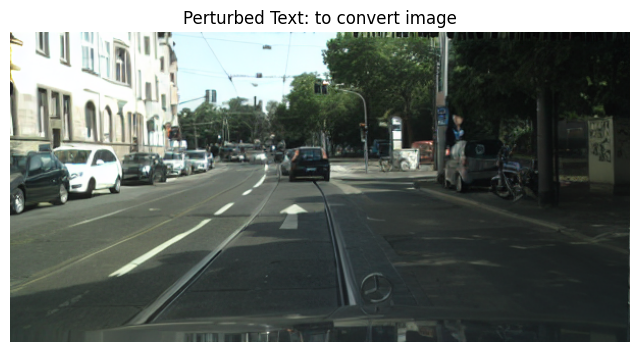

Image generation 4 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 5:
Wasserstein distance (generated vs init): 0.02821901616956287
Wasserstein distance (generated vs orig): 0.010752602253584577


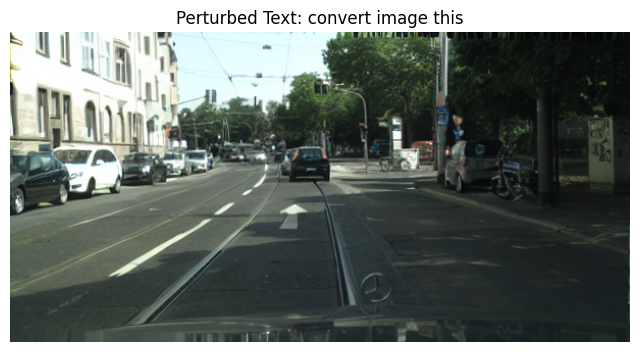

Image generation 5 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 6:
Wasserstein distance (generated vs init): 0.03232499881687546
Wasserstein distance (generated vs orig): 0.013870154749004843


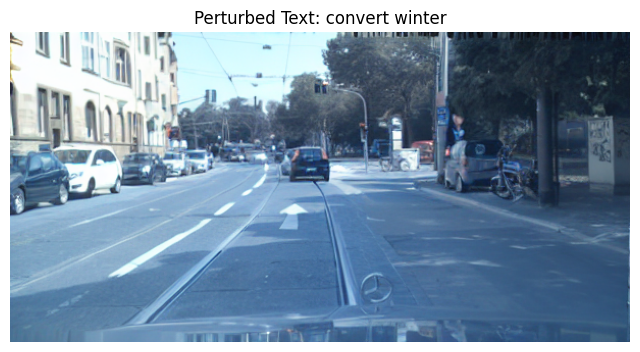

Image generation 6 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 7:
Wasserstein distance (generated vs init): 0.025890973957605944
Wasserstein distance (generated vs orig): 0.019444021079076876


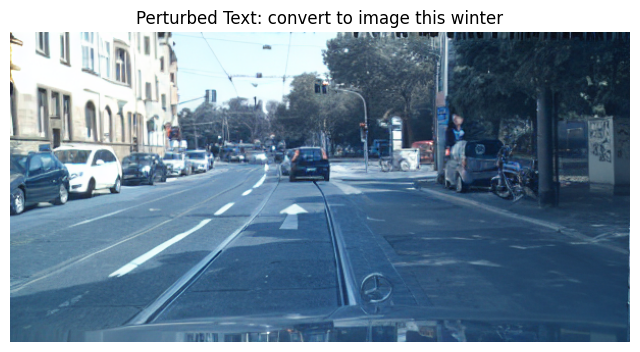

Image generation 7 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 8:
Wasserstein distance (generated vs init): 0.026461347555293
Wasserstein distance (generated vs orig): 0.008564905551187024


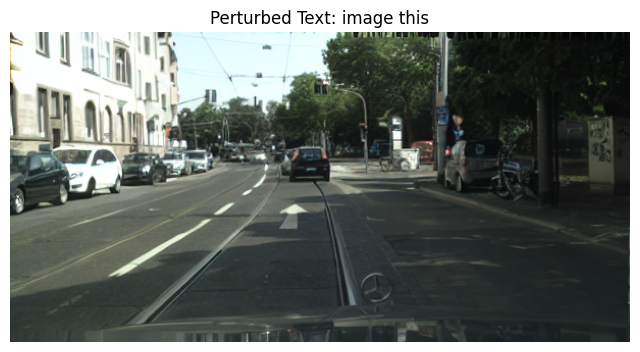

Image generation 8 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 9:
Wasserstein distance (generated vs init): 0.027054997950623758
Wasserstein distance (generated vs orig): 0.010364521103724659


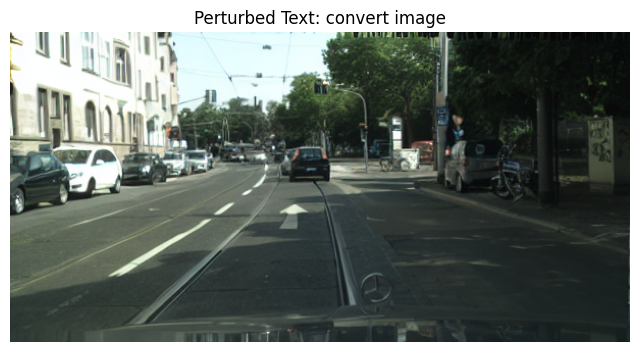

Image generation 9 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 10:
Wasserstein distance (generated vs init): 0.029981052577265178
Wasserstein distance (generated vs orig): 0.01566474160555724


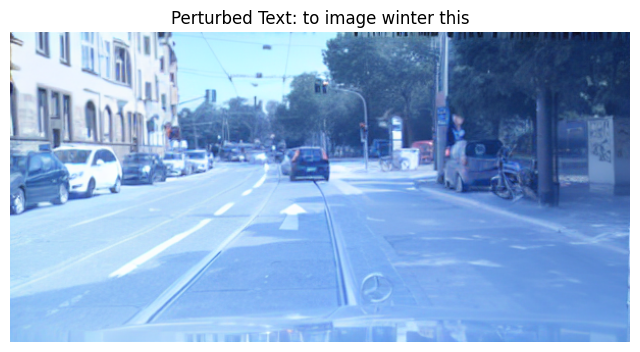

Image generation 10 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 11:
Wasserstein distance (generated vs init): 0.02576011491404038
Wasserstein distance (generated vs orig): 0.007339795804152047


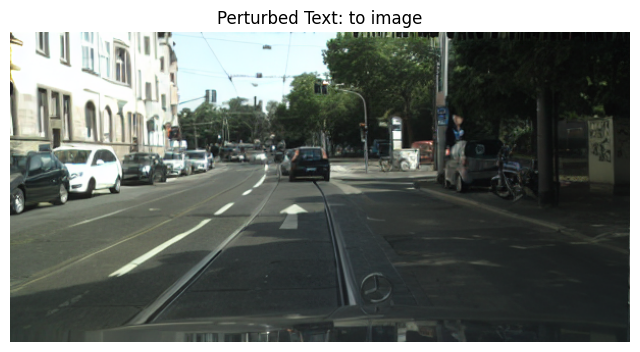

Image generation 11 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 12:
Wasserstein distance (generated vs init): 0.02641268680630068
Wasserstein distance (generated vs orig): 0.015331535525319857


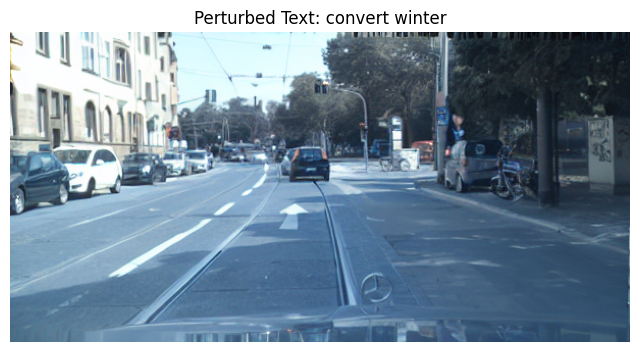

Image generation 12 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 13:
Wasserstein distance (generated vs init): 0.02990809558176959
Wasserstein distance (generated vs orig): 0.016754460677958598


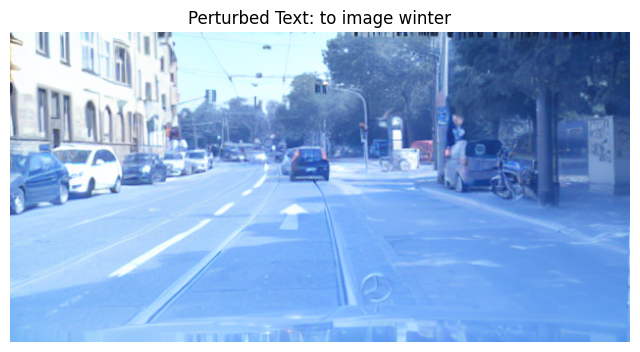

Image generation 13 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 14:
Wasserstein distance (generated vs init): 0.030063272962706847
Wasserstein distance (generated vs orig): 0.0146721485451356


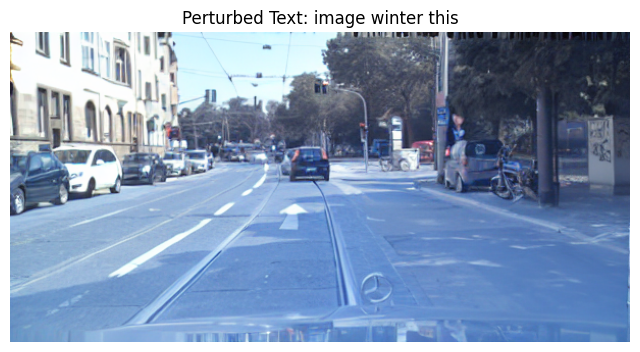

Image generation 14 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 15:
Wasserstein distance (generated vs init): 0.027855763797485146
Wasserstein distance (generated vs orig): 0.012427386612444032


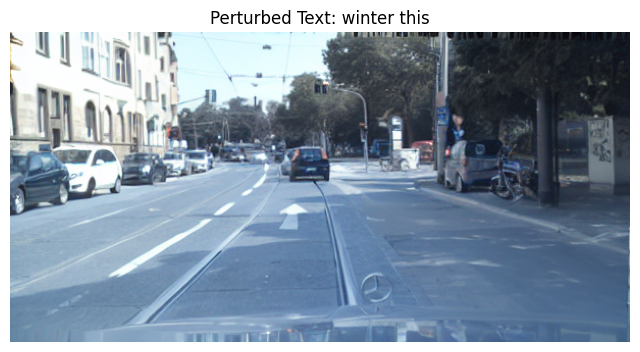

Image generation 15 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 16:
Wasserstein distance (generated vs init): 0.03192342082199198
Wasserstein distance (generated vs orig): 0.010817227595528781


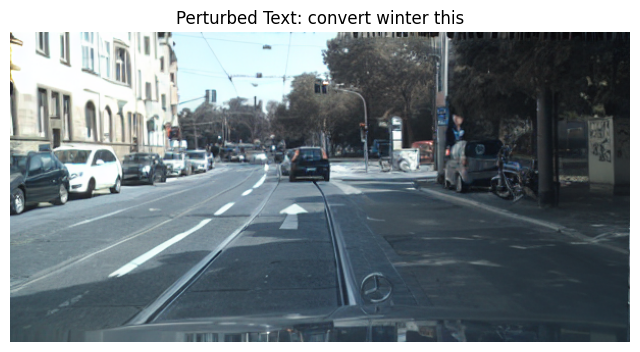

Image generation 16 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 17:
Wasserstein distance (generated vs init): 0.0283349059139558
Wasserstein distance (generated vs orig): 0.014161929247753368


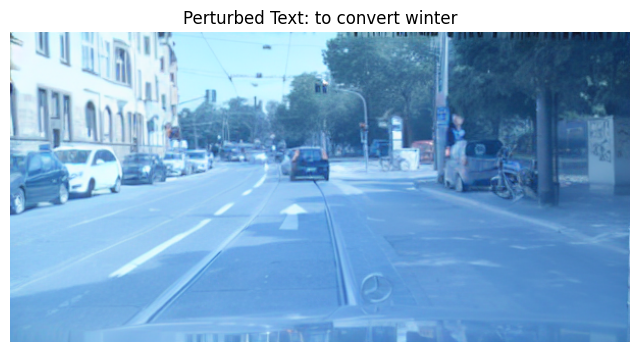

Image generation 17 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 18:
Wasserstein distance (generated vs init): 0.025447190940212763
Wasserstein distance (generated vs orig): 0.00710749583959113


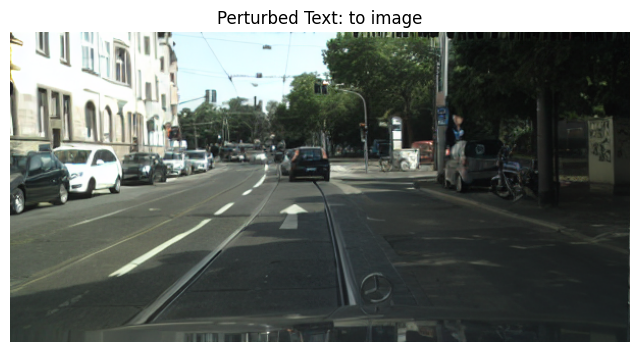

Image generation 18 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 19:
Wasserstein distance (generated vs init): 0.02615419010318952
Wasserstein distance (generated vs orig): 0.0075743404123045375


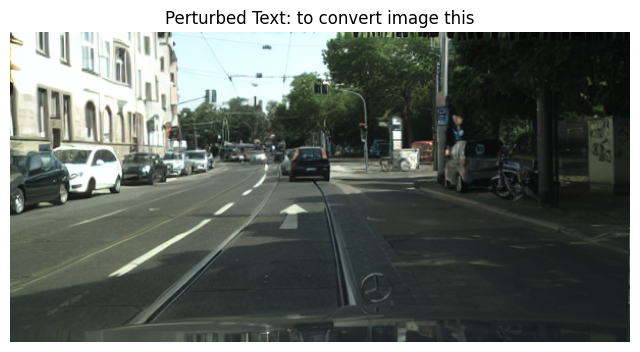

Image generation 19 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 20:
Wasserstein distance (generated vs init): 0.028005622322249728
Wasserstein distance (generated vs orig): 0.009344602250621387


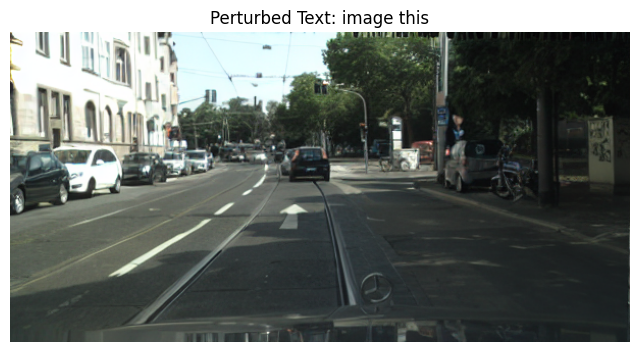

Image generation 20 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 21:
Wasserstein distance (generated vs init): 0.03039112409654384
Wasserstein distance (generated vs orig): 0.014905860345966923


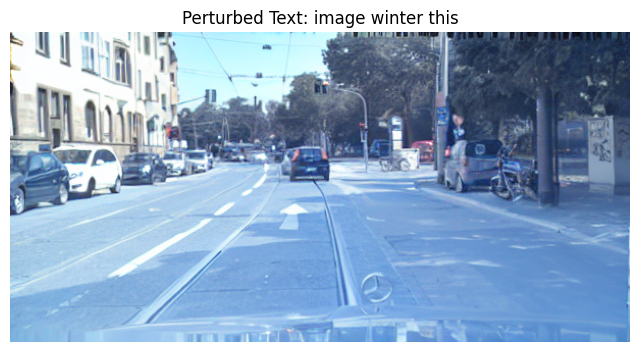

Image generation 21 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 22:
Wasserstein distance (generated vs init): 0.027367474496865437
Wasserstein distance (generated vs orig): 0.007518677974237192


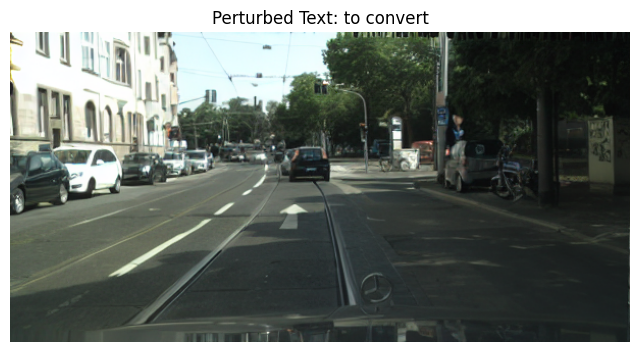

Image generation 22 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 23:
Wasserstein distance (generated vs init): 0.027273158770033973
Wasserstein distance (generated vs orig): 0.007077925725676933


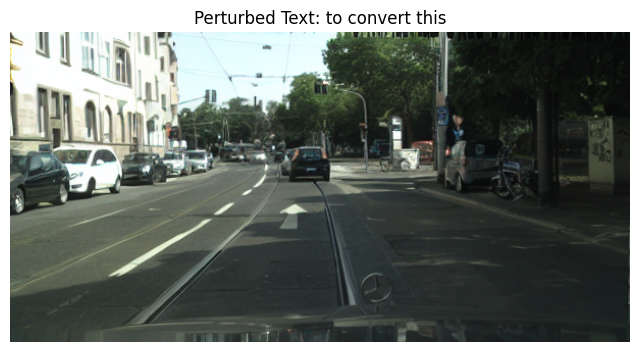

Image generation 23 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 24:
Wasserstein distance (generated vs init): 0.024536957091716743
Wasserstein distance (generated vs orig): 0.0169926323224748


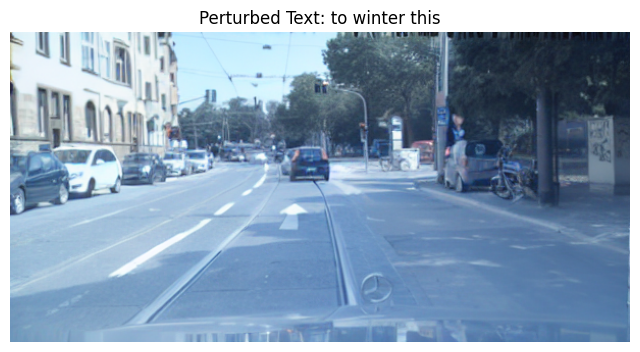

Image generation 24 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 25:
Wasserstein distance (generated vs init): 0.026531149823010025
Wasserstein distance (generated vs orig): 0.012581185773948768


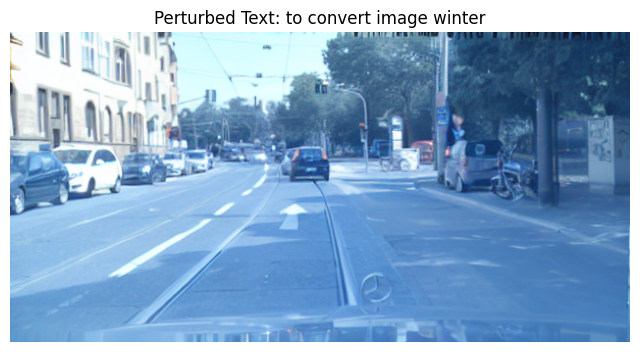

Image generation 25 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 26:
Wasserstein distance (generated vs init): 0.028144069294285166
Wasserstein distance (generated vs orig): 0.009230133055098115


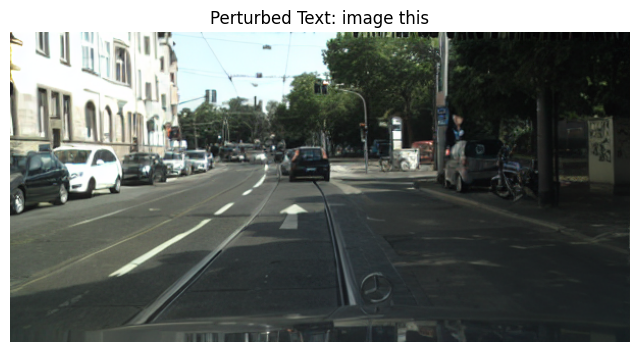

Image generation 26 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 27:
Wasserstein distance (generated vs init): 0.030368125331733616
Wasserstein distance (generated vs orig): 0.016074379838073583


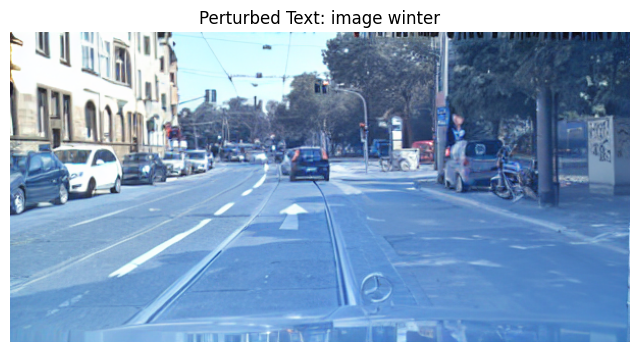

Image generation 27 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 28:
Wasserstein distance (generated vs init): 0.02591615540465379
Wasserstein distance (generated vs orig): 0.0160273106389847


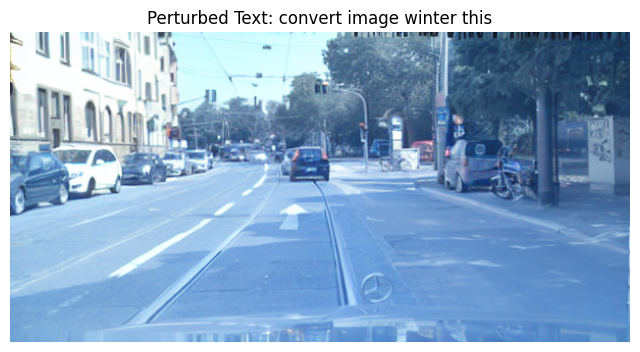

Image generation 28 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 29:
Wasserstein distance (generated vs init): 0.027932395791443323
Wasserstein distance (generated vs orig): 0.008313112528185236


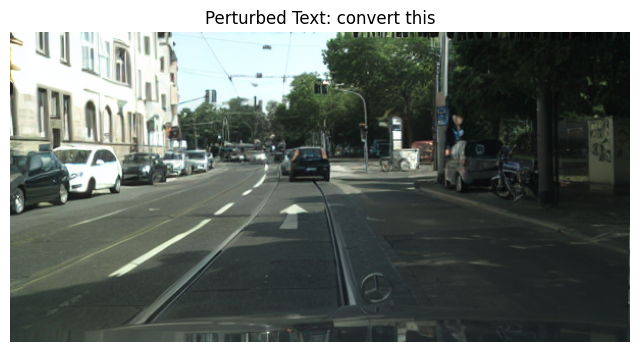

Image generation 29 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 30:
Wasserstein distance (generated vs init): 0.02687423483240537
Wasserstein distance (generated vs orig): 0.00759954909148064


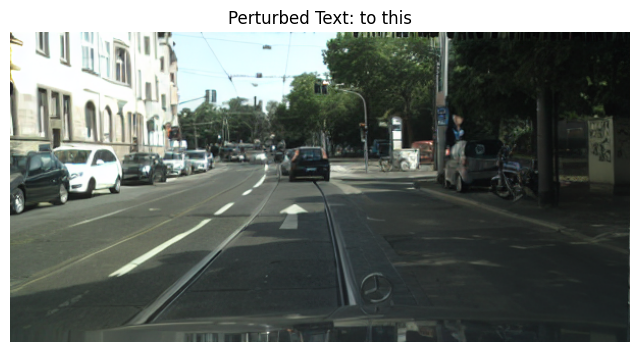

Image generation 30 complete with acceptable Wasserstein distance!
[0.43548297 0.         0.62284107 0.06088622 0.33667227 0.57460339
 1.         0.1697076  0.30705398 0.71156598 0.07620742 0.68613574
 0.79473317 0.63581143 0.46449155 0.34160447 0.59687158 0.05847832
 0.09410782 0.22921393 0.65364828 0.08985968 0.05622153 0.81291039
 0.47622948 0.22047766 0.74282951 0.73923719 0.1504908  0.09603175]
WMD Scores:

Original vs Perturbed 1: 0.2793
Original vs Perturbed 2: 0.3582
Original vs Perturbed 3: 0.1930
Original vs Perturbed 4: 0.2302
Original vs Perturbed 5: 0.1490
Original vs Perturbed 6: 0.1475
Original vs Perturbed 7: 0.0000
Original vs Perturbed 8: 0.3582
Original vs Perturbed 9: 0.2685
Original vs Perturbed 10: 0.1790
Original vs Perturbed 11: 0.4178
Original vs Perturbed 12: 0.2755
Original vs Perturbed 13: 0.2077
Original vs Perturbed 14: 0.3453
Original vs Perturbed 15: 0.2992
Original vs Perturbed 16: 0.1475
Original vs Perturbed 17: 0.2464
Original vs Perturbed 18: 0.2461

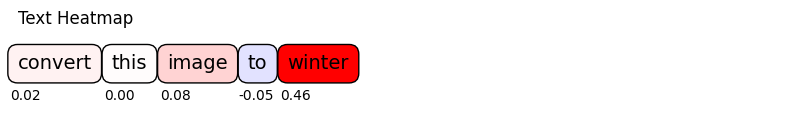

Total execution time: 1850.59 seconds


In [14]:
# Start timing
start_time = time.time()
# Setting up seeds for reproducibility
seed = 1024
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)  # If using GPU
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
generator = torch.Generator().manual_seed(seed)

def perturb_text(text_list, perturbation, rng):
    # Select words based on the perturbation flag (1 means include), ensuring no duplicate words within a single sentence
    perturbed_list_initial = [item for item, flag in zip(text_list, perturbation) if flag == 1 and item.strip() != ""]
    
    # If no words were selected, force-select at least two words
    if len(perturbed_list_initial) < 2:
        additional_words_needed = 2
        available_words = [item for item in text_list if item.strip() != ""]
        additional_words = rng.choice(available_words, additional_words_needed, replace=False)
        perturbed_list = list(set(perturbed_list_initial + list(additional_words)))  # Ensure unique words
    else:
        perturbed_list = list(set(perturbed_list_initial))  # Remove duplicates within the sentence
    
    return perturbed_list

# Assuming `prompt` is predefined
words = prompt.split()
text_list = words.copy()

num_perturb = 30  # Number of perturbations to generate
num_words = len(words)

Responses = []
Perturbations = []
unique_perturbations = set()
rng = np.random.default_rng(seed)

# Try up to a certain number of attempts to generate unique perturbations
attempts = 0
max_attempts = num_perturb * 10  # Allow 10 attempts per unique perturbation

# Loop for unique perturbations only
while len(unique_perturbations) < num_perturb and attempts < max_attempts:
    perturbation = tuple(rng.binomial(1, 0.5, size=num_words))
    if perturbation not in unique_perturbations and sum(perturbation) > 0:
        unique_perturbations.add(perturbation)
        perturbed_txt = perturb_text(text_list, perturbation, rng)
        corpus = ' '.join(perturbed_txt)
        Responses.append(corpus)
        Perturbations.append(perturbation)
        print(f"Perturbation: {perturbation}, Perturbed Text: {corpus}")  # Print unique perturbation text
    attempts += 1

# If more perturbations are needed, allow repeats by sampling from unique_perturbations
while len(Responses) < num_perturb:
    perturbation = rng.choice(list(unique_perturbations))
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    Responses.append(corpus)
    Perturbations.append(perturbation)
    print(f"Perturbation (reused): {perturbation}, Perturbed Text: {corpus}")  # Print reused perturbation text

        
epsilon = 1e-6  # A small value to prevent division by zero
WD_dists_generated_vs_orig = []  # List to store Wasserstein distances

for i, perturbation in enumerate(Perturbations):
    # Generate new text for each perturbation
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    
    # Set initial Wasserstein distances for generated image
    WD_dist_generated = float('inf')
    WD_dist_generated_vs_orig_value = float('inf')  # Distance between generated_image and orig_image (temporarily stored inside the loop)

    # Repeat generation process
    while WD_dist_generated > 0.07:  
        # Generate the original image (once, if not already generated)
        orig_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text,
        ).images[0]

        # Generate another image (generated image)
        generated_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text,
        ).images[0]

        # Extract embeddings for the generated image, original image, and initial image
        generated_embedding = extract_image_embedding(generated_image, processor, model)
        init_embedding = extract_image_embedding(init_image, processor, model)
        orig_embedding = extract_image_embedding(orig_image, processor, model)

        # Calculate Wasserstein distance between generated image and initial image
        WD_dist_generated = wasserstein_distance(generated_embedding, init_embedding)

        if WD_dist_generated > 0.07:
            print(f"Distance too large (WD_dist_generated = {WD_dist_generated}), regenerating image...")
            continue  # Go back to the beginning of the loop to regenerate the image

        # Calculate Wasserstein distance between generated image and original image
        WD_dist_generated_vs_orig_value = wasserstein_distance(generated_embedding, orig_embedding)

        # Store the Wasserstein distance between the generated image and the original image
        WD_dists_generated_vs_orig.append(WD_dist_generated_vs_orig_value)

        # Display the Wasserstein distances
        print(f"Perturbation {i + 1}:")
        print(f'Wasserstein distance (generated vs init): {WD_dist_generated}')
        print(f'Wasserstein distance (generated vs orig): {WD_dist_generated_vs_orig_value}')

        # Display the image only if the distance is acceptable
        plt.figure(figsize=(8, 8))
        plt.imshow(generated_image)
        plt.title(f"Perturbed Text: {corpus}", fontsize=12)
        plt.axis('off')  # Remove the axes
        plt.show()

        # Save the image to the output path if the distance is acceptable
        output_path = f'/kaggle/working/generated_image_{i + 1}.png'  # Set the output path for each image
        generated_image.save(output_path)
        print(f"Image generation {i + 1} complete with acceptable Wasserstein distance!")

WD_dists_generated_vs_orig = np.array(WD_dists_generated_vs_orig)

# Step 2: Scale the inverse distances between 0 and 1 (Min-Max scaling)
min_WD = np.min(WD_dists_generated_vs_orig)
max_WD = np.max(WD_dists_generated_vs_orig)

Similarities = (WD_dists_generated_vs_orig - min_WD) / (max_WD - min_WD)

# Now Similarities contains the scaled similarities between 0 and 1
print(Similarities)

wmd_scores = {}
all_texts = [prompt] + Responses  # Include the original text (prompt) and all responses (perturbed texts)

for idx, text in enumerate(Responses):  # Loop through all perturbed texts (Responses)
    wmd_score = model_txt.wmdistance(prompt, text)  # Compute WMD between prompt and perturbed text
    wmd_scores[f"Original vs Perturbed {idx+1}"] = wmd_score

# Display the WMD scores
print("WMD Scores:\n")
for key, value in wmd_scores.items():
    print(f"{key}: {value:.4f}")

# Assigning WMD scores to a variable 'distances' for future use
distances = wmd_scores

Perturbations = np.vstack(Perturbations)
distance_values = np.array(list(distances.values()))

kernel_width = 0.25

# Compute weights based on the distances
weights = np.sqrt(np.exp(-(distance_values ** 2) / (kernel_width ** 2)))

# Fit a Linear Regression model
linear_model = LinearRegression()
linear_model.fit(X=Perturbations, y=Similarities, sample_weight=weights)

# Retrieve coefficients from the model
coefficients = linear_model.coef_

# Print the coefficients and weights
print("Coefficients from the Linear Regression model:", coefficients)
print("\nComputed Weights:", weights)

# Function to plot text heatmap
def plot_text_heatmap(words, scores, title="", width=10, height=0.4, verbose=0, max_word_per_line=20, word_spacing=20, score_fontsize=10, save_path=None):
    fig = plt.figure(figsize=(width, height))
    ax = plt.gca()
    ax.set_title(title, loc='left')
    cmap = plt.cm.ScalarMappable(cmap=plt.cm.bwr)
    cmap.set_clim(0, 1)
    canvas = ax.figure.canvas
    t = ax.transData
    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5
    loc_y = -0.2
    for i, (token, score) in enumerate(zip(words, scores)):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes=True)
        color = '#%02x%02x%02x' % tuple(rgb)
        text = ax.text(0.0, loc_y, token, bbox={'facecolor': color, 'pad': 5.0, 'linewidth': 1, 'boxstyle': 'round,pad=0.5'}, transform=t, fontsize=14)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        score_text = ax.text(0.01, loc_y - 1, f"{score:.2f}", transform=t, fontsize=score_fontsize, ha='center')
        score_text.draw(canvas.get_renderer())
        ex_score = score_text.get_window_extent()
        if (i+1) % max_word_per_line == 0:
            loc_y -= 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width + word_spacing, units='dots')
    if verbose == 0:
        ax.axis('off')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

# Define the words for heatmap and save path
words = prompt.split(' ')
save_path = '/kaggle/working/text_heatmap.png'

# Call the function with the save path
plot_text_heatmap(words, coefficients, title="Text Heatmap", save_path=save_path)
# End timing
end_time = time.time()
execution_time = end_time - start_time
print(f"Total execution time: {execution_time:.2f} seconds")
